In [2]:
%pip install google-cloud-spanner
%pip install google-cloud-storage
from google.cloud import storage
from google.colab import auth
from collections import defaultdict
from google.cloud import spanner
import pandas as pd
import io
import base64
from IPython.display import HTML
from matplotlib import pyplot as plt
import numpy as np

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [4]:
auth.authenticate_user()

OSError: [Errno 30] Read-only file system: '/content'

# Total Count of Specific Clips in the Database

In [13]:
spanner_client = spanner.Client(project="prod-423420")
instance = spanner_client.instance(instance_id="predera-spanner")
db = instance.database(database_id="data-acquisition-database")


SEARCH_TAG="beach"

# sql_string_total = 'SELECT count(*) FROM  clips LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7"'
sql_string_total = f'SELECT count(*) FROM clips, UNNEST(tags) AS tag LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7" AND tag like "%{SEARCH_TAG}%"'


with db.snapshot() as snapshot:
    results = snapshot.execute_sql(sql_string_total)

    # Convert results to list of tuples
    rows = list(results)

    # Print the results
    for row in rows:
        print(f'Number of total samples: {row}')


Number of total samples: [614724]


# Distribution of Video-resolutions

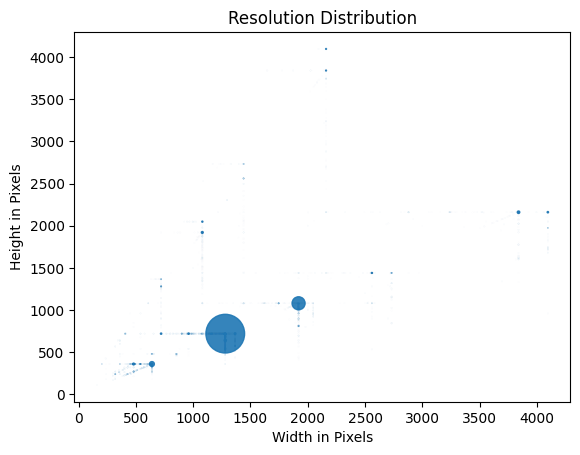

In [ ]:
sql_string_resolution = 'SELECT width, height, count(*) FROM  clips LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7" GROUP BY 1,2 ORDER BY 3 DESC'
with db.snapshot() as snapshot:
    results = snapshot.execute_sql(sql_string_resolution)

    # Convert results to list of tuples
    rows = list(results)
    x = [r[0] for r in rows]
    y = [r[1] for r in rows]
    s = [r[2] for r in rows]
    scale_arr = np.array(s).astype(float)
    scales = scale_arr / scale_arr.sum()
    plt.scatter(x, y, s=scales*900, alpha=0.9)
    plt.xlabel('Width in Pixels')
    plt.ylabel('Height in Pixels')
    plt.title('Resolution Distribution')
    plt.show()

# Duration Distribution

TypeError: the dtypes of parameters x (object) and width (float64) are incompatible

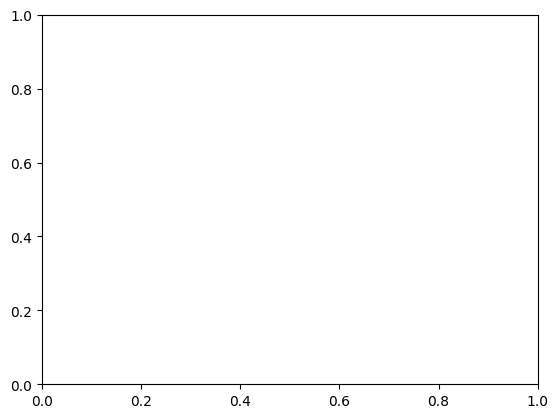

In [27]:
SEARCH_TAG="beach"
sql_string_duration = 'SELECT ROUND(FLOAT64(JSON_QUERY(metadata, "$.duration"))) as duration_s, count(*) as n FROM clips LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7" GROUP BY 1 ORDER BY 1 ASC'


with db.snapshot() as snapshot:
    results = snapshot.execute_sql(sql_string_duration)

    # Convert results to list of tuples
    rows = list(results)
    x = [r[0] for r in rows]
    y = [r[1] for r in rows]
    plt.bar(x, y)
    plt.xlabel('Duration in Seconds')
    plt.ylabel('Number of Samples')
    plt.title('Duration Distribution')
    plt.show()

# Frame Count Distribution

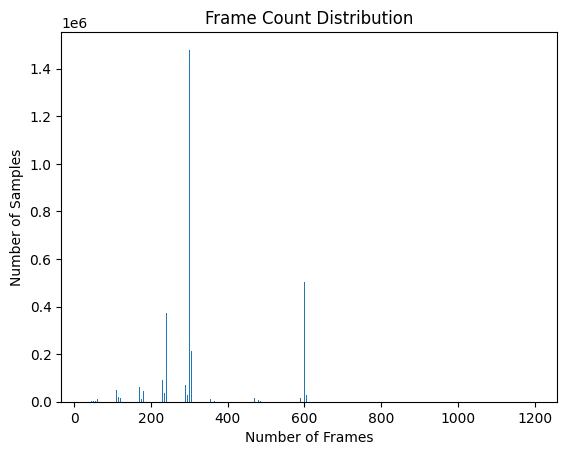

In [ ]:
sql_string_framecount = 'SELECT 5*floor(frame_count / 5) as fc, count(*) as n FROM clips LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7" GROUP BY 1'
with db.snapshot() as snapshot:
    results = snapshot.execute_sql(sql_string_framecount)

    # Convert results to list of tuples
    rows = list(results)
    x = [r[0] for r in rows]
    y = [r[1] for r in rows]
    plt.bar(x, y)
    plt.xlabel('Number of Frames')
    plt.ylabel('Number of Samples')
    plt.title('Frame Count Distribution')
    plt.show()

# Tags Distribution on Log-scale

In [ ]:
sql_string_tags = 'SELECT tag, count(*) as n FROM clips, UNNEST(tags) as tag LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7" GROUP BY 1 ORDER BY 2 DESC'
with db.snapshot() as snapshot:
    results = snapshot.execute_sql(sql_string_tags)

    # Convert results to list of tuples
    rows = list(results)


In [ ]:
import numpy as np
def aggregate_word_counts(word_counts):
  """
  Aggregates word counts from a list of (word, count) pairs.

  Args:
    word_counts: A list of (word, count) pairs.

  Returns:
    A list of (word, aggregated_count) pairs with unique words.
  """

  aggregated_counts = defaultdict(int)
  for word, count in word_counts:
    aggregated_counts[word] += count
  sorted_counts = sorted(aggregated_counts.items(), key=lambda item: item[1], reverse=True)
  return sorted_counts

def plot_word_counts(sorted_word_counts, top_n=30):
  """
  Plots word counts in a bar chart.

  Args:
    sorted_word_counts: A list of (word, count) pairs, sorted by count in descending order.
    top_n: The number of top words to display.
  """

  # Extract top N words and counts
  top_words = [word for word, _ in sorted_word_counts[:top_n]]
  top_counts = [np.log10(count) for _, count in sorted_word_counts[:top_n]]

  # Create bar chart
  plt.figure(figsize=(12, 60))
  plt.barh(top_words, top_counts, color='skyblue')
  plt.xlabel('Count')
  plt.ylabel('Word')
  plt.title('Top {} Most Frequent Words'.format(top_n))
  plt.gca().invert_yaxis()  # Invert y-axis to display most frequent word at the top
  plt.tight_layout()
  plt.show()


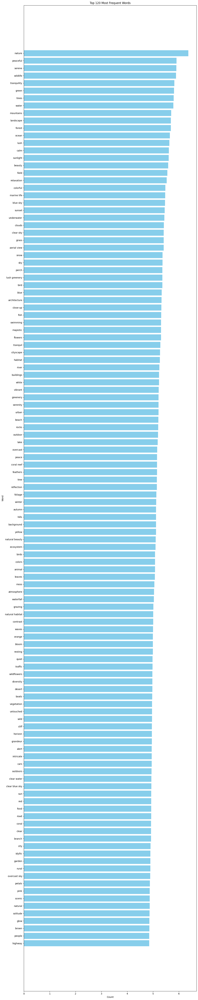

In [ ]:
sorted_word_counts = aggregate_word_counts(rows)
plot_word_counts(sorted_word_counts, top_n=120)

# Visualize Videos for a particular Caption
Change the SEARCH_TAG to find vidoes
Currently, it can only show 2 videos at a time


In [16]:
SEARCH_TAG = 'car'
sql_string_find_clip_using_tag = f'SELECT clip_id, storage_key, tags FROM clips, UNNEST(tags) AS tag LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7" AND tag like "%{SEARCH_TAG}%"'

with db.snapshot() as snapshot:
  results = snapshot.execute_sql(sql_string_find_clip_using_tag)

  # Convert results to list of tuples
  rows = list(results)
if len(rows) == 0:
  print('No videos found')
else:
  print(f'Found {len(rows)} videos')
video_file_names = [r[1]+'/video' for r in rows]
caption_file_names = [r[1]+'/metadata' for r in rows]

Found 39409 videos


# Find the video numbers for each keywords in a list (by FC)


In [ ]:
search_list=['car','city']
for SEARCH_TAG in search_list:
  sql_string_find_clip_using_tag = f'SELECT clip_id, storage_key, tags FROM clips, UNNEST(tags) AS tag LEFT JOIN date_partitions dt ON clips.date_partitions_id = dt.id WHERE lineage_hash = "28bf24e28cf34a7c81ace1e81f90ada7b50eadb7" AND tag like "%{SEARCH_TAG}%"'

  with db.snapshot() as snapshot:
    results = snapshot.execute_sql(sql_string_find_clip_using_tag)

  # Convert results to list of tuples
  rows = list(results)
  if len(rows) == 0:
    print('No videos found')
  else:
    print(f'Found {SEARCH_TAG}: {len(rows)} videos')

In [28]:
project_id = 'prod-423420'
bucket_name = 'predera-clips'

In [ ]:
storage_client = storage.Client(project=project_id)
bucket = storage_client.bucket(bucket_name)
# videos_per_row = 2
num_show_videos = 1 #Cannot show more than 2 videos currently
video_htmls = []
for i, video_file_name in enumerate(video_file_names[4000:4001]):
  blob = bucket.blob(video_file_name)
  video_content = blob.download_as_bytes()
  video_base64 = base64.b64encode(video_content).decode('utf-8')
  caption_blob = bucket.blob(caption_file_names[i])
  caption_content = caption_blob.download_as_text()
  video_html = f'''
    <figure>
      <video width="320" height="240" controls muted>
        <source src="data:video/mp4;base64,{video_base64}" type="video/mp4">
      </video>
      <figcaption>{caption_content[:1000]}</figcaption>
    </figure>
  '''
  # video_html = f'<video width="320" height="240" controls muted><source src="data:video/mp4;base64,{video_base64}" type="video/mp4"></video>'
  video_htmls.append(video_html)

# Display videos in the specified layout
HTML(''.join(video_htmls))
